<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Metrics" data-toc-modified-id="Metrics-0.1"><span class="toc-item-num">0.1&nbsp;&nbsp;</span>Metrics</a></span></li><li><span><a href="#Training" data-toc-modified-id="Training-0.2"><span class="toc-item-num">0.2&nbsp;&nbsp;</span>Training</a></span><ul class="toc-item"><li><span><a href="#Training-using-fastai" data-toc-modified-id="Training-using-fastai-0.2.1"><span class="toc-item-num">0.2.1&nbsp;&nbsp;</span>Training using fastai</a></span></li></ul></li><li><span><a href="#Using-the-model---inference-and-showing-results" data-toc-modified-id="Using-the-model---inference-and-showing-results-0.3"><span class="toc-item-num">0.3&nbsp;&nbsp;</span>Using the model - inference and showing results</a></span><ul class="toc-item"><li><span><a href="#Prediction" data-toc-modified-id="Prediction-0.3.1"><span class="toc-item-num">0.3.1&nbsp;&nbsp;</span>Prediction</a></span></li></ul></li></ul></li><li><span><a href="#Export-Model" data-toc-modified-id="Export-Model-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Export Model</a></span></li><li><span><a href="#FiftyOne-Export" data-toc-modified-id="FiftyOne-Export-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>FiftyOne Export</a></span></li></ul></div>

In [1]:
%matplotlib inline

In [3]:
!pip install fiftyone

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 21.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.5/106.5 kB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 564.0/564.0 kB 21.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.0/135.0 kB 25.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.2/29.2 MB 17.9 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 516.3/516.3 kB 22.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 12.9 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 21.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.5/132.5 kB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [4]:
import fiftyone as fo

from icevision.all import *

from fastai.callback.wandb import *
from fastai.callback.tracker import SaveModelCallback

Migrating database to v0.16.5


In [6]:
dataset_path = "/notebooks/50_slates"

# Create the parser
parser = parsers.COCOBBoxParser(annotations_filepath= f"{dataset_path}/results.json", 
                                img_dir=f"{dataset_path}/images")

In [7]:
# Parse annotations to create records
train_records, valid_records = parser.parse()
parser.class_map

  0%|          | 0/52 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/51 [00:00<?, ?it/s]

<ClassMap: {'background': 0, 'Slate': 1}>

In [8]:
# Transforms
# size is set like so because EfficientDet requires its inputs to be divisible by 128
image_size = 512
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [9]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

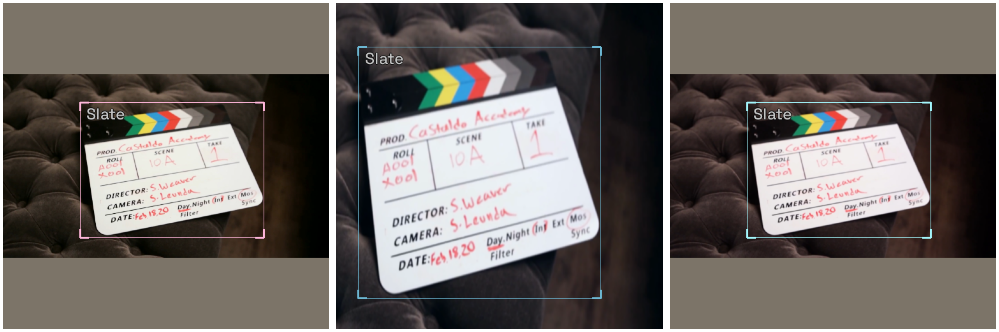

In [10]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3)

In [11]:
# Just change the value of selection to try another model

selection = 2

extra_args = {}

if selection == 0:
  model_type = models.mmdet.vfnet
  backbone = model_type.backbones.resnet50_fpn_mstrain_2x

if selection == 1:
  model_type = models.mmdet.retinanet
  backbone = model_type.backbones.resnet50_fpn_1x
  # extra_args['cfg_options'] = { 
  #   'model.bbox_head.loss_bbox.loss_weight': 2,
  #   'model.bbox_head.loss_cls.loss_weight': 0.8,
  #    }

if selection == 2:
  model_type = models.mmdet.faster_rcnn
  backbone = model_type.backbones.resnet101_fpn_2x
  # extra_args['cfg_options'] = { 
  #   'model.roi_head.bbox_head.loss_bbox.loss_weight': 2,
  #   'model.roi_head.bbox_head.loss_cls.loss_weight': 0.8,
  #    }

if selection == 3:
  model_type = models.mmdet.ssd
  backbone = model_type.backbones.ssd300

if selection == 4:
  model_type = models.mmdet.yolox
  backbone = model_type.backbones.yolox_s_8x8

if selection == 5:
  model_type = models.mmdet.yolof
  backbone = model_type.backbones.yolof_r50_c5_8x8_1x_coco

if selection == 6:
  model_type = models.mmdet.detr
  backbone = model_type.backbones.r50_8x2_150e_coco

if selection == 7:
  model_type = models.mmdet.deformable_detr
  backbone = model_type.backbones.twostage_refine_r50_16x2_50e_coco

if selection == 8:
  model_type = models.mmdet.fsaf
  backbone = model_type.backbones.x101_64x4d_fpn_1x_coco

if selection == 9:
  model_type = models.mmdet.sabl
  backbone = model_type.backbones.r101_fpn_gn_2x_ms_640_800_coco

if selection == 10:
  model_type = models.mmdet.centripetalnet
  backbone = model_type.backbones.hourglass104_mstest_16x6_210e_coco

elif selection == 11:
  # The Retinanet model is also implemented in the torchvision library
  model_type = models.torchvision.retinanet
  backbone = model_type.backbones.resnet50_fpn

elif selection == 12:
  model_type = models.ross.efficientdet
  backbone = model_type.backbones.tf_d2
  # The efficientdet model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 13:
  model_type = models.ultralytics.yolov5
  backbone = model_type.backbones.small
  # The yolov5 model requires an img_size parameter
  extra_args['img_size'] = image_size

model_type, backbone, extra_args

(<module 'icevision.models.mmdet.models.faster_rcnn' from '/opt/conda/lib/python3.9/site-packages/icevision/models/mmdet/models/faster_rcnn/__init__.py'>,
 {})

In [12]:
backbone.__dict__

{'model_name': 'faster_rcnn',
 'config_path': Path('/root/.icevision/mmdetection_configs/mmdetection_configs-2.20.1/configs/faster_rcnn/faster_rcnn_r101_fpn_2x_coco.py'),
 'weights_url': 'http://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r101_fpn_2x_coco/faster_rcnn_r101_fpn_2x_coco_bbox_mAP-0.398_20200504_210455-1d2dac9c.pth'}

In [13]:
# Instantiate the model
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), **extra_args) 

/opt/conda/lib/python3.9/site-packages/mmdet/core/anchor/builder.py:16: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  warnings.warn(
2022-08-05 19:45:42,237 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet101'}
2022-08-05 19:45:42,238 - mmcv - INFO - load model from: torchvision://resnet101
2022-08-05 19:45:42,238 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet101
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth


  0%|          | 0.00/171M [00:00<?, ?B/s]

2022-08-05 19:45:49,973 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2022-08-05 19:45:49,992 - mmcv - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2022-08-05 19:45:50,010 - mmcv - INFO - initialize RPNHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01}
2022-08-05 19:45:50,014 - mmcv - INFO - initialize Shared2FCBBoxHead with init_cfg [{'type': 'Normal', 'std': 0.01, 'override': {'name': 'fc_cls'}}, {'type': 'Normal', 'std': 0.001, 'override': {'name': 'fc_reg'}}, {'type': 'Xavier', 'layer': 'Linear', 'override': [{'name': 'shared_fcs'}, {'name': 'cls_fcs'}, {'name': 'reg_fcs'}]}]
2022-08-05 19:45:50,156 - mmcv - INFO - 
backbone.conv1.weight - torch.Size([64, 3, 7, 7]): 
PretrainedInit: load from torchvision://resnet101 
 
2022-08-05 19:45:50,157 - mmcv - INFO - 
backbone.bn1.weight - torch.Size([64]): 
PretrainedInit: load from 

load checkpoint from local path: checkpoints/faster_rcnn/faster_rcnn_r101_fpn_2x_coco_bbox_mAP-0.398_20200504_210455-1d2dac9c.pth
The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([320, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copying a param with shape torch.Size([320]) from checkpoint, the shape in current model is torch.Size([4]).


In [14]:
# Data Loaders
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=4, shuffle=False)

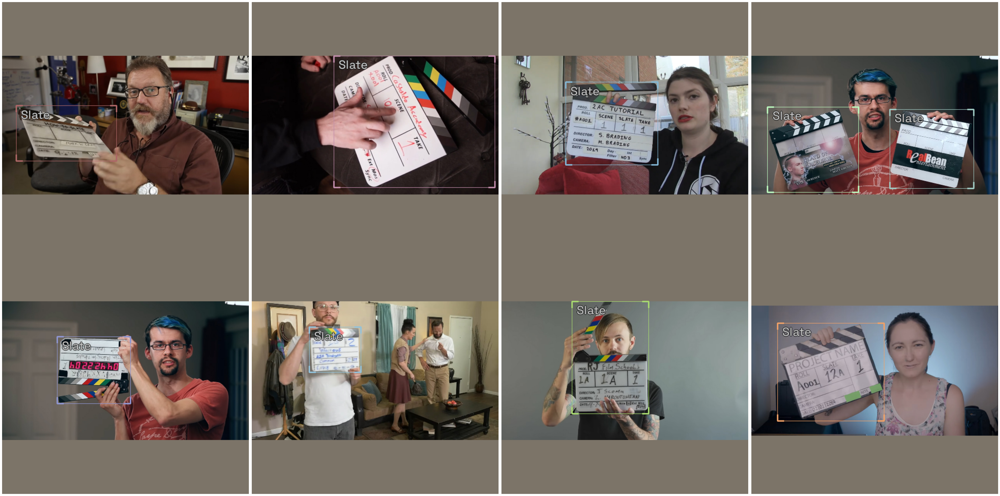

In [15]:
# show batch
model_type.show_batch(first(valid_dl), ncols=4)

## Metrics

The fastai and pytorch lightning engines collect metrics to track progress during training. IceVision provides metric classes that work across the engines and libraries.

The same metrics can be used for both fastai and pytorch lightning.

In [16]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

## Training

IceVision is an agnostic framework meaning it can be plugged into other DL learning engines such as [fastai2](https://github.com/fastai/fastai2), and [pytorch-lightning](https://github.com/PyTorchLightning/pytorch-lightning).  


### Training using fastai

In [17]:
# Instantiate wandb
wandb.init(project="Film-clapper-detector", name="2022-08-05_faster_rcnn_n-50_r-384", reinit=True)

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [18]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, 
                                  metrics=[COCOMetric(metric_type=COCOMetricType.bbox)], 
                                  cbs=[WandbCallback(), SaveModelCallback()])

/opt/conda/lib/python3.9/site-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/opt/conda/lib/python3.9/site-packages/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  warnings.warn(


SuggestedLRs(valley=0.00010964782268274575)

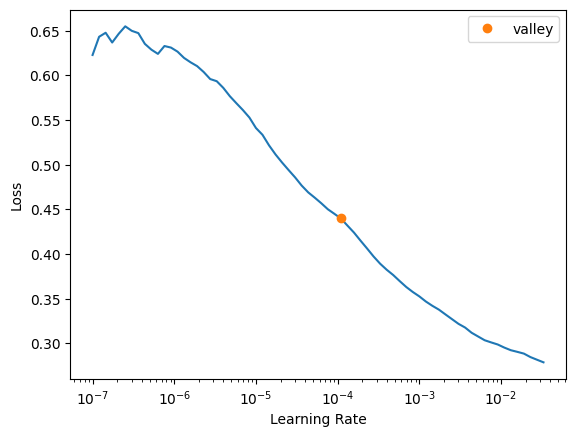

In [19]:
learn.lr_find()

# For Sparse-RCNN, use lower `end_lr`
# learn.lr_find(end_lr=0.005)

In [20]:
learn.fine_tune(20, 0.00158, freeze_epochs=1)

Could not gather input dimensions
WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'Dataset' object has no attribute 'items'


epoch,train_loss,valid_loss,COCOMetric,time
0,0.370400,0.263528,0.397057,00:05


Better model found at epoch 0 with valid_loss value: 0.26352834701538086.
Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,0.218557,0.196473,0.513086,00:04
1,0.178620,0.133692,0.599548,00:04
2,0.159350,0.129104,0.598879,00:04
3,0.144434,0.152353,0.425347,00:04
4,0.135154,0.122000,0.594235,00:04
5,0.130002,0.131427,0.640796,00:04
6,0.122449,0.124004,0.646106,00:04
7,0.115063,0.118094,0.649900,00:04
8,0.109384,0.124622,0.666688,00:04
9,0.103691,0.112050,0.660708,00:04


Better model found at epoch 0 with valid_loss value: 0.1964728832244873.
Better model found at epoch 1 with valid_loss value: 0.1336924135684967.
Better model found at epoch 2 with valid_loss value: 0.12910403311252594.
Better model found at epoch 4 with valid_loss value: 0.12199997901916504.
Better model found at epoch 7 with valid_loss value: 0.11809401214122772.
Better model found at epoch 9 with valid_loss value: 0.11205010116100311.
Better model found at epoch 10 with valid_loss value: 0.09439461678266525.


## Using the model - inference and showing results

The first step in reviewing the model is to show results from the validation dataset. This is easy to do with the `show_results` function.

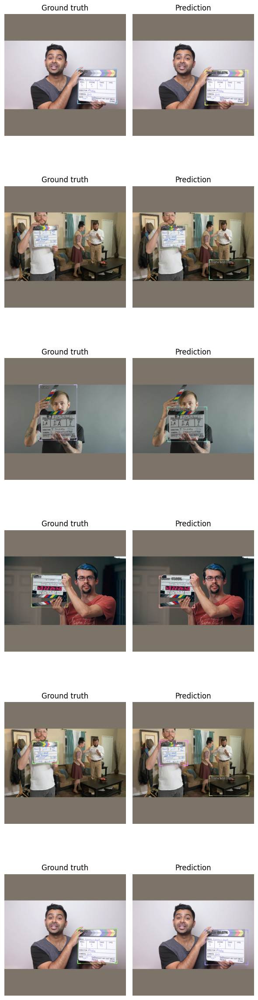

In [21]:
model_type.show_results(model, valid_ds, detection_threshold=.5)

### Prediction

Sometimes you want to have more control than `show_results` provides. You can construct an inference dataloader using `infer_dl` from any IceVision dataset and pass this to `predict_dl` and use `show_preds` to look at the predictions.

A prediction is returned as a dict with keys: `scores`, `labels`, `bboxes`, and possibly `masks`. 

Prediction functions that take a `detection_threshold` argument will only return the predictions whose score is above the threshold.

Prediction functions that take a `keep_images` argument will only return the (tensor representation of the) image when it is `True`. In interactive environments, such as a notebook, it is helpful to see the image with bounding boxes and labels applied. In a deployment context, however, it is typically more useful (and efficient) to return the bounding boxes by themselves.



> NOTE: For a more detailed look at inference check out the [inference tutorial](https://airctic.com/dev/inference/)

In [22]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=4, shuffle=False)
preds = model_type.predict_from_dl(model, infer_dl, keep_images=True)

  0%|          | 0/3 [00:00<?, ?it/s]

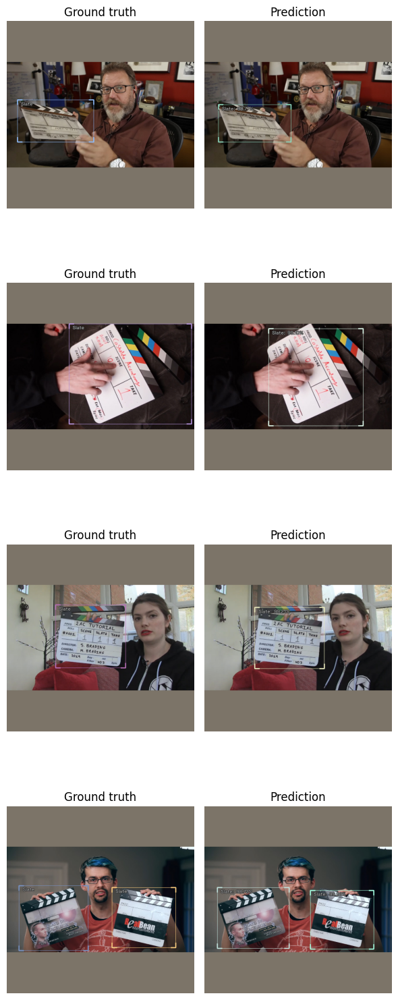

In [23]:
show_preds(preds=preds[:4])

In [24]:
# Create wandb_images for each prediction
wandb_images = wandb_img_preds(preds, add_ground_truth=True) 

# Log the wandb_images to wandb
wandb.log({"Predicted images": wandb_images})

wandb.join()

COCOMetric,▁▄▆▆▂▅▆▇▇▇▇▆▇▆▇▆██▇▆▆
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_1,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_2,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_3,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_4,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_5,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_6,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂█▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_1,▂█▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁


# Export Model

In [25]:
from icevision.models.checkpoint import *

In [26]:
model_type

<module 'icevision.models.mmdet.models.faster_rcnn' from '/opt/conda/lib/python3.9/site-packages/icevision/models/mmdet/models/faster_rcnn/__init__.py'>

In [27]:
model_name = "mmdet.faster_rcnn"
model_name

'mmdet.faster_rcnn'

In [28]:
backbone.__dict__

{'model_name': 'faster_rcnn',
 'config_path': Path('/root/.icevision/mmdetection_configs/mmdetection_configs-2.20.1/configs/faster_rcnn/faster_rcnn_r101_fpn_2x_coco.py'),
 'weights_url': 'http://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r101_fpn_2x_coco/faster_rcnn_r101_fpn_2x_coco_bbox_mAP-0.398_20200504_210455-1d2dac9c.pth',
 'pretrained': True}

In [29]:
backbone_name = "resnet101_fpn_2x"
backbone_name

'resnet101_fpn_2x'

In [30]:
image_size

512

In [31]:
save_icevision_checkpoint(model,
                        model_name=model_name, 
                        backbone_name=backbone_name,
                        img_size=image_size,
                        classes=parser.class_map.get_classes(),
                        filename='/notebooks/models/2022-07-27_resnet_slates_50.pth',
                        meta={'icevision_version': '0.12.0'})

# FiftyOne Export

In [72]:
# Set fo dataset name
fo_dataset_name = "first_50_slates"

#RandomSplitter Create fiftyone dataset
fo_dataset = data.create_fo_dataset(valid_records, fo_dataset_name)

In [73]:
# See your new dataset in the lists
fo.list_datasets()

['first_50_slates']

In [75]:
# Lets add the predictions to our prevoius dataset. 

fo_dataset = data.create_fo_dataset(detections=preds,
                                   dataset_name=fo_dataset_name,
                                   exist_ok=True,
                                   transformations=valid_tfms.tfms_list)  # Use IceVisions automatic postprocess bbox function by adding the tfms_list

In [76]:
# List datasets, to see that no new is created
fo.list_datasets()

['first_50_slates']

In [77]:
fo_dataset

Name:        first_50_slates
Media type:  image
Num samples: 22
Persistent:  False
Tags:        []
Sample fields:
    id:               fiftyone.core.fields.ObjectIdField
    filepath:         fiftyone.core.fields.StringField
    tags:             fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:         fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    icevision_record: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    ground_truth:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    prediction:       fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)

In [81]:
# The directory to which to write the exported dataset
export_dir = "/notebooks/fiftyone/"

# Export the dataset
fo_dataset.export(
    export_dir=export_dir,
    dataset_type=fo.types.FiftyOneDataset,
    export_media=False,
)

In [71]:
fo.delete_dataset("first_50_slates")